# End to End Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow and TensorFlow Hub.

## 1. Problem

Identifying a breed of dog by an image of dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are aroung 10,000+ images in the train set(these images have labels)
* There are aroung 10,000+ images in the test set(these images have no labels, because we'll want to predict them).


In [ ]:
# Unzip the uploaded data
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# Get our workspace ready

* Import TenserFlow 2
* Import TenserFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.12.0


In [ ]:
# Import TensorFlow into colab
import tensorflow_hub as hub
print("TF hub version", hub.__version__)

TF hub version 0.14.0


In [ ]:
# Check for GPU availability
print("GPU", "available (Yess!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (Yess!!)


## Getting our data ready(turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's we'll be doing first. Turning our images into Tensors (numerical representaions).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

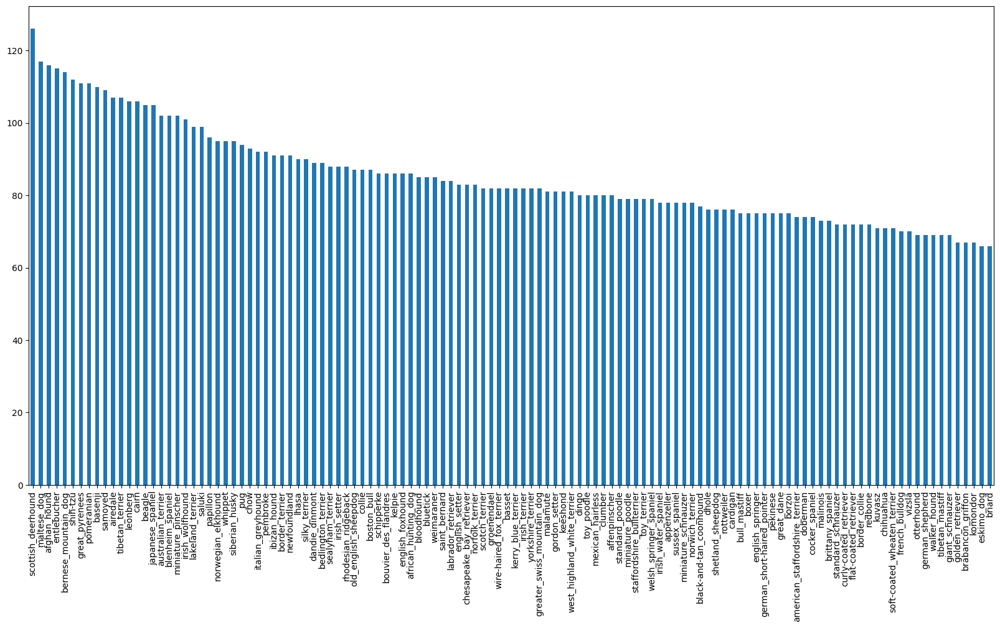

In [ ]:
# How many images of each breed we have
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

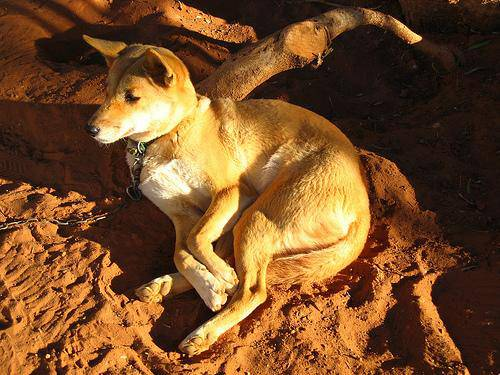

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all our image file pathnames

In [ ]:
# Create pathnames from image id
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check wether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!!! Proceed.


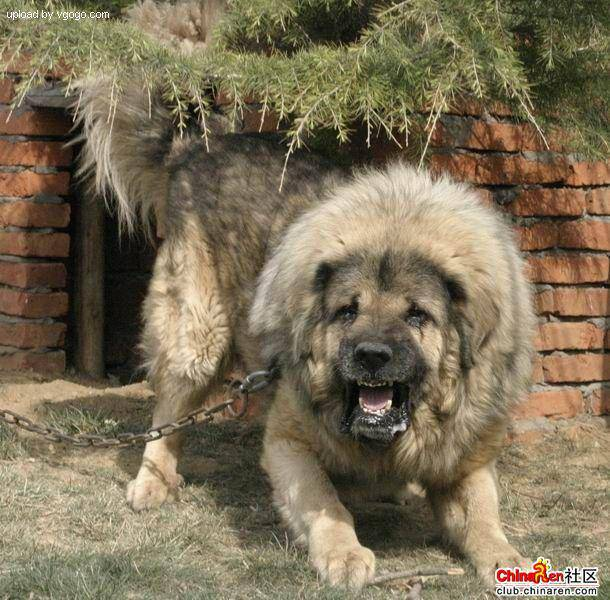

In [ ]:
# one more check
Image(filenames[9000])

Since we've now got our training image filepaths in a list, let's prepare our labels


In [ ]:
labels = labels_csv["breed"]
labels.head()

0         boston_bull
1               dingo
2            pekinese
3            bluetick
4    golden_retriever
Name: breed, dtype: object

In [ ]:
import numpy as np
labels = np.array(labels)
# labels = labels_csv["breed"].to_numpy # Does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Matched")
else:
  print("not Matched, Check data directory")

Matched


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
from pandas.core.arrays import boolean
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where lavel occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come woth validation set, we're going to create our own


In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels


We're going to start off experimenting with ~1000 images and increase as needed


In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (Turning images into Tensors)

To preprocess our images into Tensors we're going to write a finction which does a few things:
1. Take an image file path as input
2. Use TensorFlow to read the file and save it to a variable. `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5, Return the modified `image`

Before we do, let's see what importing an image looks like


In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a funtion to preprocess them.
1. Take an image file path as input
2. Use TensorFlow to read the file and save it to a variable. `image`
3. Turn our `image` (a jpg) into Tensors
4. Nirmalize our image (convert color channels values from 0-225 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
# Definr image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns image into tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-225 to 0-1 values(Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)

In [ ]:
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 images (Batch size) at a time (you can manually adjust the btach size if neede)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).



In [ ]:
# Create a simple function whihc will return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the images and returns a tuple of(image, label)
  """
  image = process_image(image_path)

  return image, label

In [ ]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of the data in batches

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of images(X) and label(y) pairs.
  Shuffles the data if it's training data but doesnt shuffle if it's validation data.
  Also accepts test data as input(no labels)
  """
  # if the data is test dataset, we probably don't have labels
  if test_data:
    print("creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches")
    data =  tf.data.Dataset.from_tensor_slices((tf.constant(X),# filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Create training data batches")
    # Turn filepaths and labels into temnsors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffleling the pathnames and labels before mapping image processor function is faster than shuffle
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples this also turns the image path into a preprocessed image
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch





In [ ]:
from sqlalchemy.engine import create
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Create training data batches
Creating validation data batches


In [ ]:
# Check out the differnet attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize the data.

In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  plt.figure(figsize=(15,18))
  # loop thjough 25(for displaying 25 images)
  for i in range(25):
    # create subplots
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    # plt.axis("off")


In [ ]:
# To convert tensors to NumPy array
# .as_numpy_iterator() => Creates iterator that iterates over batches
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.34593174, 0.18286885, 0.2056293 ],
          [0.40772858, 0.25047114, 0.2608671 ],
          [0.38670915, 0.2540915 , 0.24370109],
          ...,
          [0.10012924, 0.17463903, 0.05463268],
          [0.11021061, 0.17687728, 0.04926855],
          [0.11427703, 0.17500868, 0.04464286]],
 
         [[0.39899018, 0.265543  , 0.26808232],
          [0.37839934, 0.2595793 , 0.24795787],
          [0.33100826, 0.22516336, 0.19635557],
          ...,
          [0.1137255 , 0.1738644 , 0.06013889],
          [0.10950069, 0.16832422, 0.04675559],
          [0.10958992, 0.16544594, 0.0379423 ]],
 
         [[0.19459425, 0.10642233, 0.08676649],
          [0.20959087, 0.138315  , 0.10187659],
          [0.1807019 , 0.12183281, 0.06735977],
          ...,
          [0.1297092 , 0.1797442 , 0.07025541],
          [0.11822322, 0.16825822, 0.05155654],
          [0.116923  , 0.16149992, 0.04479824]],
 
         ...,
 
         [[0.83529264, 0.7655095 , 0.64390165],
          [0.82338

In [ ]:
len(train_labels)

32

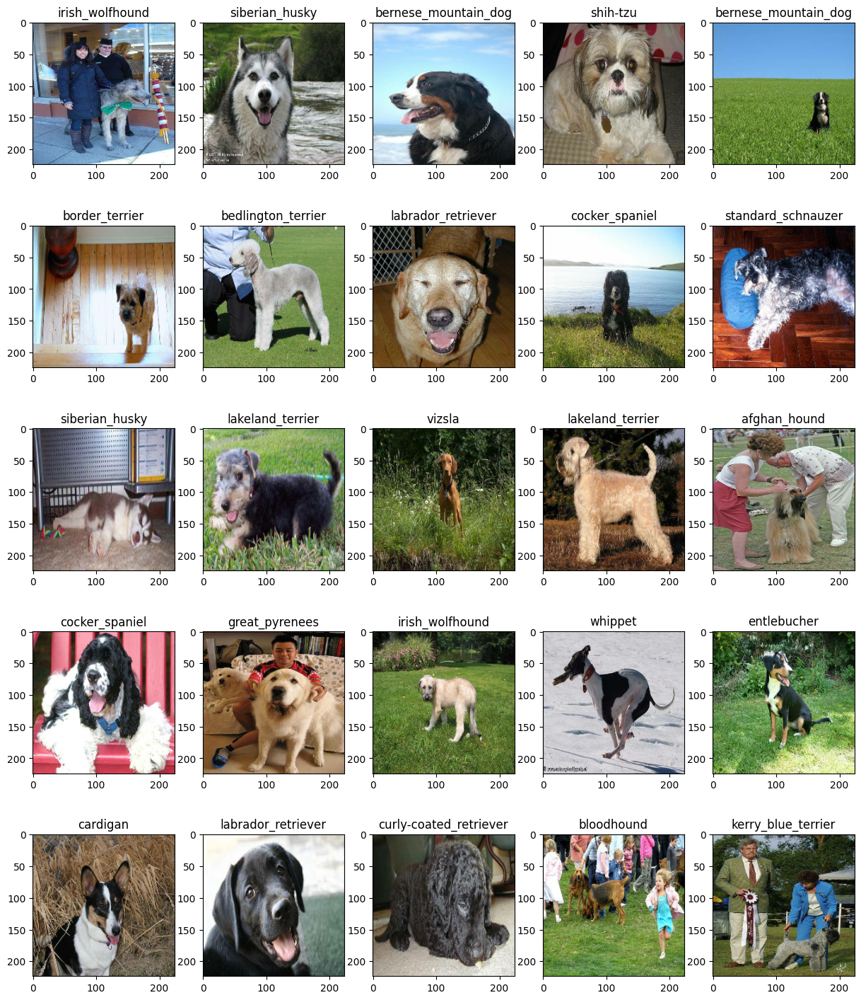

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

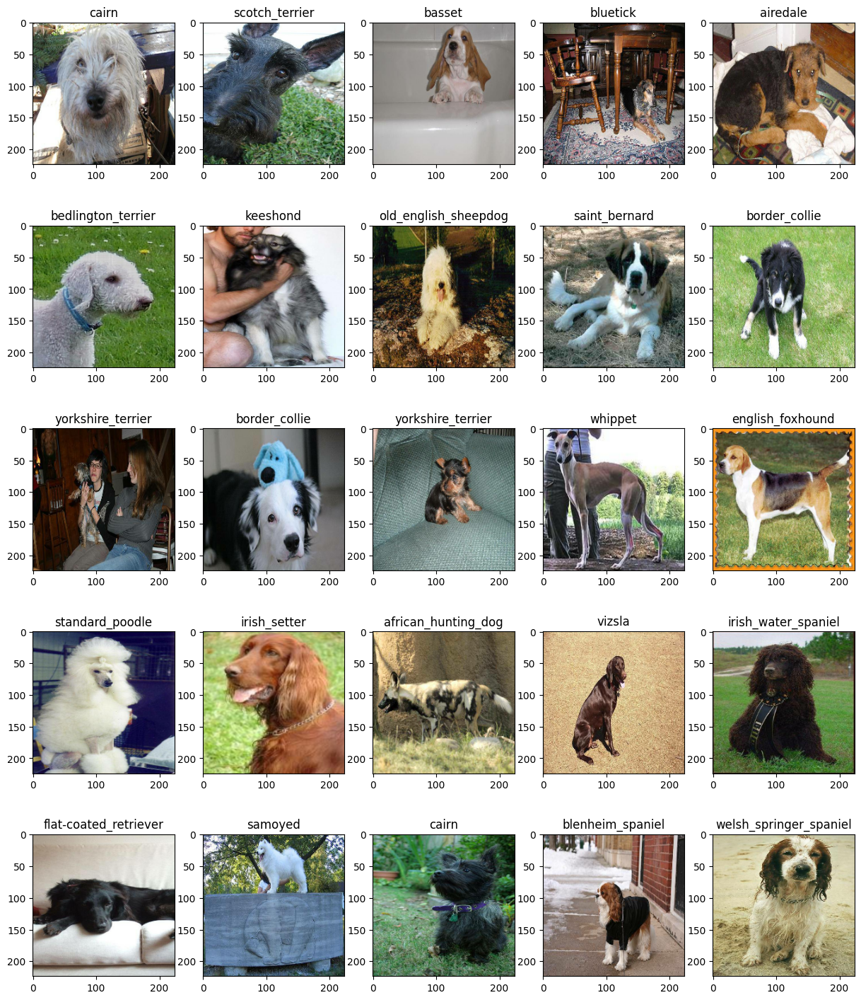

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The `input` shape (our images shape, in the form of tensors) to our model.
* The output shape (image labels, in the form of tensors) of our model.
* The URL of the model we want to use.
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]# Batch , height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model

Knowing this, let's create a function which:
* Tajes the input shape, output shape and the model we've chosen as parameters.
* defines the layers in a Keras model in sequential fashion.
Comiles the model(says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model.


In [ ]:
# Create a function whihc builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer1(input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model


After applying softmax each interval will be in interval (0,1), and the components will add up to 1

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


#### Which activation to use?
* Binary Classification -> activation = sigmoid
* Multi-class Classifiaction -> activation = softmax

#### Which loss?
* Binary -> loss = binary_crossentropy
* Multi-class -> loss = CategoricalCrossentropy

## Creating callbacks

Callbacks are helper functions a model can use during training tto do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for TensorBoard which helps track our model progress and another for early stopping which prevents our model being overfitted.

### Tensorboard Callbaxk

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard Callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model training logs with the `%tensorboard` magic funtion (we'll do this after model training).


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going ot train on 1000 images,to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're sure we're still running on a GPU
print("GPU available (YES!!!)"if tf.config.list_physical_devices("GPU") else "not aavialble")

GPU available (YES!!!)


Let's write down the function which trains a model
* Create a model using `create_model()`
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validating data, number of epochs to train for(NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and retirn the trained model
def train_model():
  """
  Trains a given model and returns the trasined version.
  """

  model = create_model()

  # Create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 361s 14s/step - loss: 4.5207 - accuracy: 0.1175 - val_loss: 3.5027 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 176ms/step - loss: 1.6153 - accuracy: 0.6800 - val_loss: 2.2005 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 3s 121ms/step - loss: 0.5549 - accuracy: 0.9312 - val_loss: 1.7300 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 4s 147ms/step - loss: 0.2487 - accuracy: 0.9900 - val_loss: 1.5138 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 3s 127ms/step - loss: 0.1429 - accuracy: 0.9987 - val_loss: 1.4287 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.0983 - accuracy: 1.0000 - val_loss: 1.3726 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================

It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset.

Overfitting to begin with is good thing it means our model is learning

### Checking the TensorBoard logs

The TensorBoard magic function (`% tensorbord`) will access the logs directory we created and visualize its contents.


In [ ]:


%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs  --port=8008


<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

NameError: ignored

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(predictions[0])

120

In [ ]:
predictions[0]

array([3.99167975e-03, 4.53598710e-04, 1.89975748e-04, 2.29995974e-04,
       5.24123316e-04, 3.15310608e-05, 2.10929159e-02, 2.79381580e-04,
       3.31389136e-04, 7.34780158e-04, 1.58766564e-03, 1.91179104e-04,
       1.50832254e-03, 1.37177776e-04, 8.62190500e-04, 2.71999394e-03,
       4.30418062e-04, 1.45723164e-01, 6.02045220e-05, 8.83766770e-05,
       1.12005288e-03, 3.45468259e-04, 2.35162479e-05, 4.08352399e-03,
       4.37930394e-05, 5.57041378e-04, 2.24508375e-01, 8.75332626e-05,
       8.01005226e-04, 3.98198841e-04, 2.43538781e-03, 1.14659127e-03,
       1.95442140e-03, 7.68749014e-05, 1.42480640e-04, 3.40149514e-02,
       1.13847913e-04, 4.80580435e-04, 3.99332312e-05, 1.14699244e-04,
       3.06361401e-03, 1.26144048e-04, 3.22223896e-05, 7.24434038e-04,
       5.55813458e-05, 2.56361382e-04, 3.97502772e-05, 2.79950065e-04,
       6.69703819e-04, 2.83294474e-04, 7.63457210e-04, 2.16815861e-05,
       6.82821381e-04, 3.55029551e-05, 1.07710890e-04, 1.18568110e-04,
      

The highest value here is correspond to the index of the label that the model think is most likely

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction

index=0
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}" )


[3.99167975e-03 4.53598710e-04 1.89975748e-04 2.29995974e-04
 5.24123316e-04 3.15310608e-05 2.10929159e-02 2.79381580e-04
 3.31389136e-04 7.34780158e-04 1.58766564e-03 1.91179104e-04
 1.50832254e-03 1.37177776e-04 8.62190500e-04 2.71999394e-03
 4.30418062e-04 1.45723164e-01 6.02045220e-05 8.83766770e-05
 1.12005288e-03 3.45468259e-04 2.35162479e-05 4.08352399e-03
 4.37930394e-05 5.57041378e-04 2.24508375e-01 8.75332626e-05
 8.01005226e-04 3.98198841e-04 2.43538781e-03 1.14659127e-03
 1.95442140e-03 7.68749014e-05 1.42480640e-04 3.40149514e-02
 1.13847913e-04 4.80580435e-04 3.99332312e-05 1.14699244e-04
 3.06361401e-03 1.26144048e-04 3.22223896e-05 7.24434038e-04
 5.55813458e-05 2.56361382e-04 3.97502772e-05 2.79950065e-04
 6.69703819e-04 2.83294474e-04 7.63457210e-04 2.16815861e-05
 6.82821381e-04 3.55029551e-05 1.07710890e-04 1.18568110e-04
 1.17003379e-04 1.19113540e-02 1.32515398e-03 7.91374519e-02
 2.05175471e-04 1.02784135e-04 2.04719622e-02 4.00081335e-05
 4.63209930e-04 2.791605

In [ ]:
unique_breeds[17]

'border_terrier'

Having the above functionality is great but we want to be able to be able to do it at scale

And it would be more good if we can see image

**Note:** Prediction Probabilities are also known as confidence levels

In [ ]:
# Turn Probabilites to their respective labels
def get_pred_label(prediction_probabilites):
  """
  Turns an array of prediction probabilites into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilites)]

# Get a predicted label based on an array of prediction probabilities
# pred_label = get_pred_label(predictions[9])
# pred_label

Now since our validation dataset is still in a brch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """

  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels


# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []
# Loop through unbatches data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)


images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

Now we've got ways to ge:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some functions to make this all vizualize

We'll create a function which will:
* Take an array of prediction probabilites an array of truth labels and an array of images and integers.
* Covert the prediction probabilites to a predicted label.
* plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title dpending on the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

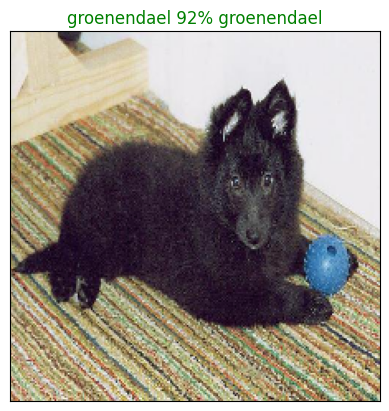

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualise our models top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction_probabilites array and a ground truth arrat and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot The top 10 Prediction probabilities values and labels, colouring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along woth the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 Prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")
  # Change the color of the tru label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


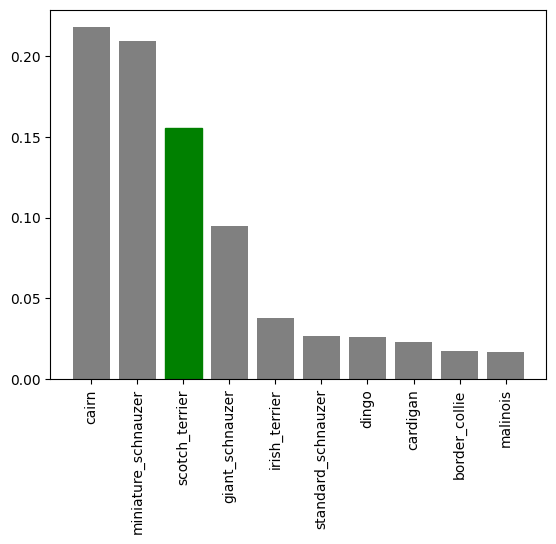

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's checl out a few.

NameError: ignored

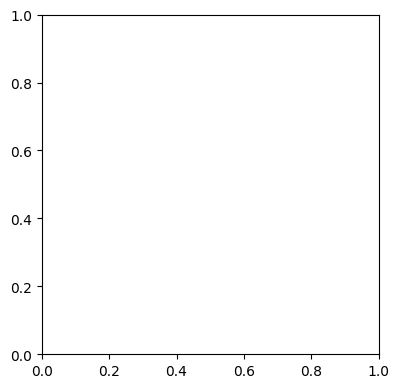

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2* num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and loading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix  + ".h5" # Save frmat of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a saved model
def load_model(model_path):
  """
  Loads a saved model from a specified oath.
  """
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000--images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230811-03551691726120_1000--images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230811-03551691726120_1000--images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_trained_model = load_model("drive/MyDrive/Dog Vision/models/20230810-17461691689582_1000--images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230810-17461691689582_1000--images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.3124 - accuracy: 0.6450


[1.3124139308929443, 0.6449999809265137]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_trained_model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.3323 - accuracy: 0.6000


[1.3323456048965454, 0.6000000238418579]

## Training a big dog model on full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
X_train[:10]

['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/MyDrive/Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/MyDrive/Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/MyDrive/Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/MyDrive/Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/MyDrive/Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [ ]:
len(y_train)

800

In [ ]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with full data batch
full_data = create_data_batches(X, y)


Create training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Createa a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Createa full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validations set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor =  "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while (maybe up to 30 min for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3546s 11s/step - loss: 1.3129 - accuracy: 0.6700
Epoch 2/100
320/320 [==============================] - 39s 121ms/step - loss: 0.3902 - accuracy: 0.8853
Epoch 3/100
320/320 [==============================] - 35s 109ms/step - loss: 0.2349 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1523 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1078 - accuracy: 0.9768
Epoch 6/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0764 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 38s 120ms/step - loss: 0.0580 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0459 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0368 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 37s 115m

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230811-05161691730972_full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230811-05161691730972_full-image-set-mobilenetv2-Adam.h5'

## Making prediction on full dataset



In [ ]:
load_full_model = load_model("drive/MyDrive/Dog Vision/models/20230811-05161691730972_full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230811-05161691730972_full-image-set-mobilenetv2-Adam.h5...


In [ ]:
load_full_model.evaluate(val_data)

7/7 [==============================] - 10s 144ms/step - loss: 0.0092 - accuracy: 1.0000


[0.009163280948996544, 1.0]

## Making predictions on the dataset

Since our model has been trained on images in the form of Tensors batches, to male predictions on thetest data, we'll have to get it into the same format.

Luckilt we created `create_data_batches()` warlier which can take a list if filennames as unout and convert them into Tensor batches.
To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filneames into test data batches using `create_data_btacges()` anf setting the `test_data` parameter to `True` (since the test data doesnt have lavebls).
* Make a predictions arraty by passing test batches to the `predict()` method called on our model.

In [ ]:
# Load the image filenames
import os
test_path = "drive/MyDrive/Dog Vision/test"
test_filenames = [test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/testdef88eeacc633cbc3d46d5f5fb495379.jpg',
 'drive/MyDrive/Dog Vision/testdea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 'drive/MyDrive/Dog Vision/teste64b53f9c0fefdd97e269c55335418e7.jpg',
 'drive/MyDrive/Dog Vision/testde85fdcf74dbe025b9b89819735cb9bc.jpg',
 'drive/MyDrive/Dog Vision/teste312dda8d35118c40880c0f331c09509.jpg',
 'drive/MyDrive/Dog Vision/testdf645ae75554d4d7130bfa1b72be53ce.jpg',
 'drive/MyDrive/Dog Vision/teste7340d1efa70bf6d6c134e1e150f9473.jpg',
 'drive/MyDrive/Dog Vision/teste2915c191c0bc761b795b78f66845fe0.jpg',
 'drive/MyDrive/Dog Vision/teste292584f17fa7cea7f95bdadecde0ebb.jpg',
 'drive/MyDrive/Dog Vision/testdd5c5652d5d34e922af98c9b0295d909.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True )

creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run(about an hour).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = load_full_model.predict(test_data, verbose=1)

NameError: ignored

In [ ]:
# Save predictions (NumPy array) to csv file (for later access)
# np.savetxt("drive/MyDrive/ Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:5]

array([[1.61196489e-09, 3.44086413e-12, 2.32834394e-11, 1.40799395e-12,
        5.98032956e-09, 2.14533929e-11, 5.32851652e-10, 1.76493417e-10,
        4.49105718e-11, 1.84297355e-09, 5.29732508e-14, 6.22356655e-09,
        5.95073361e-13, 2.66395013e-08, 3.28688065e-15, 1.21886199e-11,
        1.19793180e-08, 2.38417955e-13, 4.40795955e-10, 3.99062901e-11,
        2.83421154e-13, 3.95438716e-12, 1.97962841e-10, 8.23695487e-11,
        1.06676962e-05, 1.19700536e-14, 9.42683501e-11, 6.76076625e-11,
        1.22097462e-11, 1.13671131e-05, 2.65428781e-12, 2.08955270e-10,
        3.13114146e-10, 2.81222046e-09, 4.10381153e-15, 1.54404389e-13,
        8.28562479e-12, 3.35177133e-12, 7.26731988e-13, 2.19305407e-11,
        2.61968953e-08, 2.37896139e-12, 9.63114245e-13, 4.27652705e-12,
        3.16920490e-10, 4.95381652e-11, 7.48146662e-13, 1.53999684e-13,
        1.32033314e-13, 5.06832687e-10, 1.54794150e-10, 9.16578554e-13,
        6.30603514e-10, 7.39330645e-12, 9.43311193e-11, 2.102985

In [ ]:
## Preparing test dataset predictions for Kaggle


## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepthas into data batches using `create_data_batches()`. And since our custom images wont have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the predictions output probabilities to predictions labels.
* Compare the predicted labels to the custom images.


In [ ]:
# Get custom images filepaths
import os
custom_path = "drive/MyDrive/Dog Vision/my-dog-pics/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-pics/dog4.jpg',
 'drive/MyDrive/Dog Vision/my-dog-pics/dog3.jpg',
 'drive/MyDrive/Dog Vision/my-dog-pics/dog1.jpg',
 'drive/MyDrive/Dog Vision/my-dog-pics/dog2.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_prefs = load_full_model.predict(custom_data)

1/1 [==============================] - 1s 585ms/step


In [ ]:
custom_prefs.shape

(4, 120)

In [ ]:
# get custom image predictions labels
custom_pred_labels = [get_pred_label(custom_prefs[i]) for i in range(len(custom_prefs))]
custom_pred_labels

['eskimo_dog', 'german_shepherd', 'newfoundland', 'greater_swiss_mountain_dog']

In [ ]:
# Get the custom images (pur unbatchify () functio wont work since there aren't ;labels.. maybe we could fix that later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)




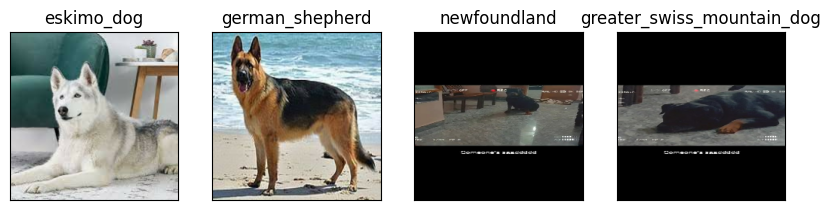

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',
